# Model Inspection

## Load the selected model 

In [18]:
import os
import re
import pickle
import pandas as pd
import numpy as np
import warnings
from gensim.test.utils import datapath
import pyLDAvis
import pyLDAvis.gensim
import gensim.corpora as corpora
from gensim.matutils import Sparse2Corpus

warnings.filterwarnings("ignore", category=FutureWarning)

# Load selected model
models_dir = datapath("train_models\\")
selected_model = "nb5_na04_a1_b1_models.pkl"
with open(os.path.join(models_dir, selected_model), "rb") as handle:
    model = pickle.load(handle)

a1_b1_k20 = model["a1_b1_k20"]

# Load dictionary 
dictionary = corpora.Dictionary.load(datapath("vocabulary\\{}".format("nb5_na04")))

# load trained bigram
filename = datapath('train_bigram\\{}_bigram.pkl'.format("nb5_na04"))
with open(filename, "rb") as f:
    train_bigram = pickle.load(f)
    
# Load train data
df_train = pd.read_csv('.\\Datasource_backup\\sub_onetree_train.csv')

X_train = train_bigram.transform(df_train['clean_text'].tolist())
corpus = Sparse2Corpus(X_train, documents_columns=False)

## Top words per topic

In [22]:
top_words = a1_b1_k20.show_topics(num_topics=20, num_words=10, formatted = False)
top_words

[(0,
  [('blind', 0.012500665),
   ('shade', 0.0047304593),
   ('motor', 0.0033362366),
   ('curtain', 0.0025299648),
   ('roller', 0.0017535106),
   ('motorize', 0.0013108166),
   ('smart blind', 0.0011659745),
   ('family', 0.0011432683),
   ('somfy', 0.0010473863),
   ('serena', 0.00080931163)]),
 (1,
  [('vote', 0.0030909674),
   ('count', 0.00038994645),
   ('poll', 0.00038322734),
   ('thermostat use', 0.00018756965),
   ('com see', 0.00017034831),
   ('option current', 0.00016824486),
   ('real time', 0.00016300459),
   ('post update', 0.00016298752),
   ('datum make', 0.00016106786),
   ('see live', 0.00016069521)]),
 (2,
  [('bestbuy', 4.880881e-05),
   ('clearance', 4.4594035e-05),
   ('buzzer', 4.4323304e-05),
   ('z_wave line', 4.4246837e-05),
   ('search google', 4.422241e-05),
   ('title', 4.419873e-05),
   ('setup look', 4.4010594e-05),
   ('geeni', 4.397103e-05),
   ('good buy', 4.392556e-05),
   ('nanoleaf', 4.3896423e-05)]),
 (3,
  [('bot', 0.00036131384),
   ('affili

## pyLDAvis

#### INTERPRETATION
**Output**: probability mass function over the words in the model for each topic <br />
**Scatter plot**: distance between topics in the scatter plot is an approximation of the difference between topic distribution (approximation of the semantic relationship) <br />
**Bubble size**: is the topic prevalence <br />
**Indices inside the bubbles**: indicate the sorted topic prevalence. Bubble number 1 is the most popular topic to the last <br />
**Bar**: list top 30 words given the topic <br />
**Red bars**: frequency of each word given a topic <br />
**Gray bars**: overall word frequency <br />
**How other topics use the word?**: Visualize the unexplained portion of a words within a topic by simply going with the mouse over the word <br />
**Distance between circles**: represents topic similarity (approx to the original topic similarity matrix, since we are using a two dimensional scatter plot). t-distributed Stochastic Neighbor Embedding and/or Multidimensional Scaling do their best to preserve the original distance. 



#### INTERFER MEANING
Interactively tune relevance metric (parameter lambda) to introduce new words that are specific to the topic. <br />
**Decreasing lambda** more weight on the ratio red to gray (word's frequency within the topic to the overall word's frequency). This can improve readability for those who are not familiar with the topic. 

In [19]:
# Visualize the topics using Jensen-Shannon Divergence & t-distributed Stochastic Neighbor Em
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(a1_b1_k20, corpus, dictionary, mds='TSNE')
vis

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
19     -86.324081   77.576187       1        1  27.188328
18      87.321045   42.727180       2        1  19.228214
9       -8.079474 -135.395660       3        1  15.204676
7       27.079103   21.761009       4        1  13.406717
4       13.453932  -33.941944       5        1   3.845754
16    -130.159027   -1.944330       6        1   3.211398
13      33.943920  -82.159111       7        1   3.114143
15     -70.083328  -41.442909       8        1   2.192870
11     -76.111877   19.798809       9        1   2.086014
5       65.443848  -21.459068      10        1   1.825676
0      -25.561760  -74.759262      11        1   1.202496
12     124.694336  -12.209311      12        1   1.147076
17    -120.451828  -71.745193      13        1   0.882576
3       97.567139  -75.831345      14        1   0.790664
8      -21.077265  106.498177      15        1   0.789247
10      61.080036 -134.857224      16        1   0.787279
1      -21.829264   48.185539      17        1   0.785650
6      -71.046036 -116.349403      18        1   0.770410
14      39.783436   83.211830      19        1   0.770407
2      -28.139484   -6.723354      20        1   0.770407, topic_info=      Category         Freq        Term        Total  loglift  logprob
68     Default  8593.000000      switch  8593.000000  30.0000  30.0000
16     Default  6691.000000       light  6691.000000  29.0000  29.0000
260    Default  3070.000000      google  3070.000000  28.0000  28.0000
32     Default  1962.000000        door  1962.000000  27.0000  27.0000
733    Default  1408.000000        lock  1408.000000  26.0000  26.0000
...        ...          ...         ...          ...      ...      ...
15775  Topic20     0.324093          v3    36.016273   0.1553 -10.0437
1941   Topic20     0.325936  affordable    83.924118  -0.6850 -10.0380
420    Topic20     0.325513          uk   210.445404  -1.6056 -10.0393
5392   Topic20     0.322377       stock    74.138664  -0.5720 -10.0490
1471   Topic20     0.321827   know good    46.277145  -0.1024 -10.0507

[1131 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
23886      1  0.074087   10a
23886      2  0.074087   10a
23886      3  0.074087   10a
23886      4  0.074087   10a
23886      5  0.074087   10a
...      ...       ...   ...
2254       5  0.073037  zone
2254       6  0.003176  zone
2254       7  0.003176  zone
2254       8  0.003176  zone
2254       9  0.003176  zone

[7963 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 19, 10, 8, 5, 17, 14, 16, 12, 6, 1, 13, 18, 4, 9, 11, 2, 7, 15, 3])

In [20]:
# Visualize the topics using ensen-Shannon Divergence & Principal Coordinate Analysis(aka Classical Multidimensional Scaling)
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(a1_b1_k20, corpus, dictionary)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
19    -0.239637  0.024524       1        1  27.188244
18    -0.201822  0.004926       2        1  19.228178
9     -0.179390  0.089585       3        1  15.204762
7     -0.177891 -0.112275       4        1  13.406790
4      0.004842 -0.116990       5        1   3.845727
16     0.021121  0.039749       6        1   3.211397
13     0.024563  0.045861       7        1   3.114142
15     0.058126  0.020589       8        1   2.192860
11     0.062395 -0.004800       9        1   2.086019
5      0.064609  0.019589      10        1   1.825673
0      0.062005  0.000961      11        1   1.202494
12     0.055441  0.002624      12        1   1.147077
17     0.056403 -0.001732      13        1   0.882576
3      0.055759 -0.001658      14        1   0.790663
8      0.055451 -0.001602      15        1   0.789247
10     0.056166 -0.001740      16        1   0.787279
1      0.055818 -0.001641      17        1   0.785650
6      0.055342 -0.001996      18        1   0.770410
2      0.055349 -0.001987      19        1   0.770406
14     0.055349 -0.001987      20        1   0.770406, topic_info=      Category         Freq        Term        Total  loglift  logprob
68     Default  8593.000000      switch  8593.000000  30.0000  30.0000
16     Default  6691.000000       light  6691.000000  29.0000  29.0000
260    Default  3070.000000      google  3070.000000  28.0000  28.0000
32     Default  1962.000000        door  1962.000000  27.0000  27.0000
733    Default  1408.000000        lock  1408.000000  26.0000  26.0000
...        ...          ...         ...          ...      ...      ...
15775  Topic20     0.324069          v3    36.016277   0.1552 -10.0437
1941   Topic20     0.325936  affordable    83.924118  -0.6850 -10.0380
420    Topic20     0.325484          uk   210.445496  -1.6057 -10.0394
5392   Topic20     0.322357       stock    74.138702  -0.5720 -10.0490
1471   Topic20     0.321822   know good    46.277184  -0.1024 -10.0507

[1134 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
23886      1  0.074087   10a
23886      2  0.074087   10a
23886      3  0.074087   10a
23886      4  0.074087   10a
23886      5  0.074087   10a
...      ...       ...   ...
2254       5  0.073036  zone
2254       6  0.003175  zone
2254       7  0.003175  zone
2254       8  0.003175  zone
2254       9  0.003175  zone

[7984 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 19, 10, 8, 5, 17, 14, 16, 12, 6, 1, 13, 18, 4, 9, 11, 2, 7, 3, 15])

## Informative topics - categories: 

| Index pyLDAvis |Inferred topic | LDA topic number |
|----------------|----------------|------------------|
| 1 | Broad topic regarding Automation - Devices - Network | 19 |
| 2 | Smart lights | 18 |
| 3 | Smart termostat | 9 |
| 4 | Home entertainment - voice assistant | 7 |
| 5 | Audio - Speakers | 4 |
| 6 | Smart Lock systems | 16 |
| 8 | Smart camera - surveillance | 15 |
| 9 | Smart plugs - power systems | 11 |
| 10 | Smart door systems | 5 |

## Summary output:

#### Find the topic with the highest contribution for each document:

In [94]:
# Find the topic number with the highest 
def dominant_topic(ldamodel, corpus, document):
    # init dataframe
    topics_df = pd.DataFrame()

    # GET MAIN TOPIC IN EACH DOCUMENT
    # Get throught the pages
    for num, doc in enumerate(ldamodel[corpus]):
        # Count number of list into a list
        if sum(isinstance(i, list) for i in doc)>0:
            doc = doc[0]

        doc = sorted(doc, key= lambda x: (x[1]), reverse=True)
    
        for j, (topic_num, prop_topic) in enumerate(doc):
            if j == 0: # => dominant topic
                # Get list prob. * keywords from the topic
                pk = ldamodel.show_topic(topic_num)
                topic_keywords = ', '.join([word for word, prop in pk])
                # Add topic number, probability, keywords and original text to the dataframe
                topics_df = topics_df.append(pd.Series([int(topic_num), np.round(prop_topic, 4),
                                                    topic_keywords, document[num]]),
                                                    ignore_index=True)
            else:
                break
                
    # Add columns name
    topics_df.columns = ['Dominant_Topic', '%_Contribution', 'Topic_Keywords', 'Text']

    return topics_df


df_dominant_topic = dominant_topic(a1_b1_k20, corpus, df_train['text'])


In [95]:
df_dominant_topic.head(10)

,Dominant_Topic,%_Contribution,Topic_Keywords,Text
0,18.0,0.4738,"switch, light, bulb, hue, control, turn, dimme...",Worthwhile smart home devices? <SUB> So my hom...
1,18.0,0.5132,"switch, light, bulb, hue, control, turn, dimme...",Looking for switches that I can control with A...
2,19.0,0.8230,"device, hub, go, wifi, thing, automation, good...","Best Roomba Alternatives - Cheaper, Stronger &..."
3,18.0,0.6306,"switch, light, bulb, hue, control, turn, dimme...",240v Light Dimming options? <SUB> I have Light...
4,18.0,0.7139,"switch, light, bulb, hue, control, turn, dimme...",Looking for dimmers for my setup. <SUB> I’m br...
5,7.0,0.3132,"turn, google, tv, control, alexa, app, light, ...",Question on smart plugs at my office <SUB> Hey...
6,18.0,0.3253,"switch, light, bulb, hue, control, turn, dimme...",Trajectio: inexpensive motion powered Hue ligh...
7,7.0,0.5926,"turn, google, tv, control, alexa, app, light, ...",Stringify shutting down <SUB> nan <SUB> I need...
8,19.0,0.3979,"device, hub, go, wifi, thing, automation, good...",Which smart devices do you love/use the most? ...
9,9.0,0.2256,"sensor, house, system, thermostat, nest, go, m...",Getting Alexa to recognize Nest thermostat <SU...


### Example:
Original submission and tree text

In [64]:
print(df_train["text"][0])

Worthwhile smart home devices? <SUB> So my home just became smart today, and my main reason is to be able to use Alexa to make my life easier. As a wheelchair user, this is a great thing as I no longer have to for someone to turn on my lights for me. 

I bought the wink hub for its compatibility with so many things, yet I feel like spending 100 dollars on a hub that only controls 5 bulbs. 

Are there any must have devices for a smart home? 
Especially any recommendations for a wheelchair user? 

I thought about a smart garage door opener, but ours still works fine, and is probably too old for any retrofit type adapter. (20 yr old lift master)

I was hoping they made a (not uber expensive) handicap-like door opener. Like the ones at stores.

If r/smarthome has any recommendations let me know. <SUB> Well, the Wink speaks many languages, that's for sure.  Good choice, in my opinion.

As for what could work for you?  This door closer can handle a 35 pound door:

http://www.epivots.com/mpow

**Assigned topics oredered by their contribution**

In [74]:
sorted(a1_b1_k20[corpus][0][0], key= lambda x: (x[1]), reverse=True)

[(18, 0.47379008),
 (19, 0.18784444),
 (5, 0.17691943),
 (9, 0.057668768),
 (7, 0.022504669),
 (0, 0.015226694)]

#### Find the most representative document for each topic in order to infer the topic:

In [303]:
df_topic_sorted = pd.DataFrame()
df_topic_grouped = df_dominant_topic.groupby('Dominant_Topic')

for i, grp in df_topic_grouped:
    # populate the sorted dataframe with the document that contributed the most to the topic
    df_topic_sorted = pd.concat([df_topic_sorted, grp.sort_values(['%_Contribution'], ascending = [0]).head(1)], axis = 0)
    
# Reset Index and change columns name
df_topic_sorted.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

df_topic_sorted.loc[df_topic_sorted["Topic_Num"].isin([19, 18, 9, 7, 4, 16, 15, 11, 5])]

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
775,4.0,0.7190,"echo, google, speaker, amazon, google home, al...",Google Home AND Alexa everywhere VS whole apar...
7100,5.0,0.6189,"door, garage, garage door, open, opener, door ...",Alternative to MyQ garage opener? <SUB> I look...
4145,7.0,0.9802,"turn, google, tv, control, alexa, app, light, ...",Walmart is offering the $59.99 harmony hub dea...
7020,9.0,0.9413,"sensor, house, system, thermostat, nest, go, m...",HVAC guy said Nest Thermostats are bad for Fur...
4742,11.0,0.5490,"plug, smart plug, outlet, strip, smart outlet,...","Dumb question and not sure where it goes, wine..."
6543,15.0,0.7237,"camera, cam, outdoor, record, arlo, security c...",Recommendations for security cameras that reco...
3297,16.0,0.7322,"lock, door, smart lock, august, key, unlock, d...",New Home Owner - Smart Lock Questions <SUB> He...
6230,18.0,0.9458,"switch, light, bulb, hue, control, turn, dimme...","Switch I bought won't work, bulbs the solution..."
3327,19.0,0.9525,"device, hub, go, wifi, thing, automation, good...",SmartThing Support is asking me to open ports ...


### Example:
**Most representative text for topic 19 (Broad topic regarding Automation - Devices - Network):**

In [305]:
print(df_train["text"][3327])

SmartThing Support is asking me to open ports to the interwebs <SUB> EDIT 3: New hub arrived - immediately updated itself after being plugged in. Something had gone wrong with my old hub the no amount of resets could fix.

I did notice some physical differences between my "old" v2 hub and the "new" v2 hub they mailed me. Perhaps there have been some improvements with a newer revision.

Once everything was migrated, the new hub did solve my original problem (with camera live stream) and all is well. Still waiting in the store credit I was promised...

= = = = = = = = = = = = = 

EDIT 2: Samsung is shipping me a new hub, and gave me a little store credit since I will now have to re-pair 25 individual "things" with the new hub plus re-make my routines. What fun!!!

[kodack10's suggestion](https://www.reddit.com/r/homeautomation/comments/5fiuco/smartthing_support_is_asking_me_to_open_ports_to/dakteb4/) was ultimately the test that decided it (take my router out of the equation entirely). M

**Most representative text for topic 4 (Audio - Speakers):**

In [306]:
print(df_train["text"][775])

Google Home AND Alexa everywhere VS whole apartment audio with a high-quality receiver <SUB> So basically after reading a lot, I've decided to go with both Google Home and Alexa as I believe they kinda complement each other.  


That's OK - filling all the rooms with Google Home Minis and Amazon Echo Dots is definitely doable and given coming Black Friday deals it's not even that expensive.  


However, this gets more complicated. I would also like to have a whole apartment audio system - so that I can play music on my DENON/Onkyo/Yamaha/Sony/whatever receiver (with it's 7.2.4 speakers) but also using all my smart speakers in each and every room for it at the same time.  


So far I haven't found any ways of doing that.  


1. DENON only supports HEOS (but I really like DENON!), which means I end up with ridiculous 3 speakers in each and every room (HEOS, GH, Amazon) from which only one plays at any given time. However it has an ethernet port (which is an additional advantage for me), 

**Verify assigned topics oredered by their contribution for the following text**

In [114]:
print(df_train["text"][5860])

Smart lights but dumb switches <SUB> How do you guys deal with dumb switches connected to your smart lights? I've got a lot of smart products set up, but I've never bitten on the lights. Beyond exterior.

I'm thinking of dipping my toes into them, but I don't want to have to tell Google to turn my God damn lights on and off every single time. I know my wife would be pissed of the baby was sleeping and I had to okay Google! turn the.. . OKAY GOOGLE. HEY GOOGLE. TURN THE LIGHTS OFF!

And I know I'd be pissed if everytime I DID ask Google or my IFTTT attempted to turn them on the dumb switch was blocking them from receiving the command.

So smart bulbs. Once you buy in, are you all just going around yelling commands at your alexa/home everytime you need to take a piss? <SUB> Just use switch covers. I have fifty smart bulbs in my house and it works well.


In [307]:
sorted(a1_b1_k20[corpus][5860][0], key= lambda x: (x[1]), reverse=True)

[(17, 0.46320614), (18, 0.23434256), (7, 0.17727092), (19, 0.010997688)]

#### Return the topics based on a word query 

In [326]:
a1_b1_k20.get_term_topics('security', minimum_probability=0.001)

[(9, 0.0020087508), (15, 0.00354912), (19, 0.0021285776)]

In [331]:
a1_b1_k20.get_term_topics('privacy', minimum_probability=0.0001)

[(19, 0.0003161084)]

In [334]:
a1_b1_k20.get_term_topics('trust', minimum_probability=0.0001)

[(19, 0.00038578294)]

In [337]:
a1_b1_k20.get_term_topics('connectivity', minimum_probability=0.0001)

[(12, 0.00051127264), (19, 0.0002805013)]

In [342]:
a1_b1_k20.get_term_topics('personal', minimum_probability=0.0001)

[(4, 0.00015831692), (19, 0.0002335844)]

#### Topic distribution across documents

In [151]:
# To check how widely a topic was discussed

# Number of documents for each topic
topic_counts = df_dominant_topic['Dominant_Topic'].value_counts()

# Percentage of Documents for each Topic
topic_contribution = np.round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = df_topic_sorted[['Topic_Num', 'Keywords']].set_index(df_topic_sorted['Topic_Num'])

df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis = 1)

df_dominant_topics.reset_index(drop = True, inplace = True)
df_dominant_topics.columns = ['Topic_Num', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

df_dominant_topics

,Topic_Num,Topic_Keywords,Num_Documents,Perc_Documents
0,0.0,"blind, shade, motor, curtain, roller, motorize...",25,0.0035
1,1.0,"vote, count, poll, thermostat use, com see, op...",2,0.0003
2,3.0,"bot, affiliate, appropriate, action perform, c...",5,0.0007
3,4.0,"echo, google, speaker, amazon, google home, al...",263,0.0364
4,5.0,"door, garage, garage door, open, opener, door ...",84,0.0116
5,7.0,"turn, google, tv, control, alexa, app, light, ...",1001,0.1385
6,8.0,"circuit, consumption, energy monitoring, diffe...",2,0.0003
7,9.0,"sensor, house, system, thermostat, nest, go, m...",1289,0.1783
8,10.0,"shower, manner, neighbour, detect shower, dete...",5,0.0007
9,11.0,"plug, smart plug, outlet, strip, smart outlet,...",112,0.0155


#### Word coluds of Top N Keywords in Each Topic

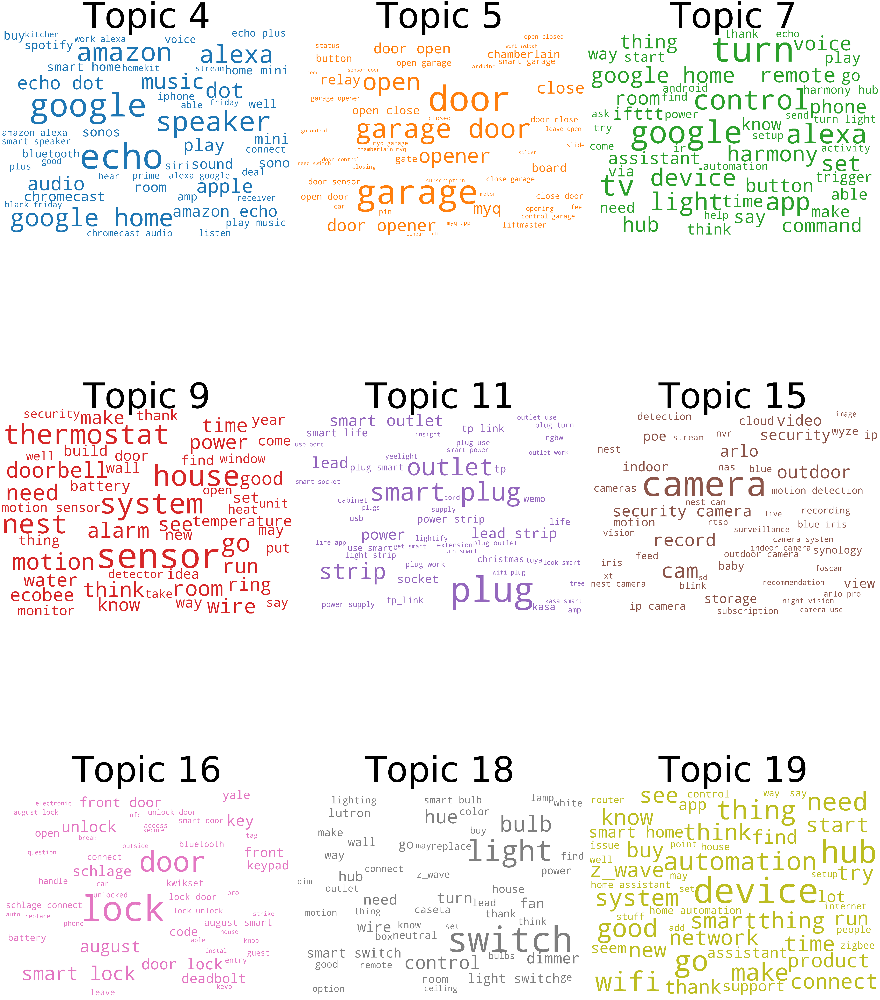

In [369]:
# with the size of the words proportional to the weight
from wordcloud import WordCloud

cloud = WordCloud(background_color='white',
                  width=2500,
                  height=1800,
                  max_words=50,
                  color_func=lambda *args, **kwargs: list(list(mcolors.TABLEAU_COLORS.values())*2)[i],
                  prefer_horizontal=1.0)

topics = a1_b1_k20.show_topics(num_topics=20, num_words=50, formatted=False)
topics = [(x, dist) for (x, dist) in topics if x in [19, 18, 9, 7, 4, 16, 15, 11, 5]]
topic_num = [x for (x, dist) in topics]


fig, axes = plt.subplots(3, 3, figsize=(70,100), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(topic_num[i]), fontdict=dict(size=200))
    plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0.01)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

#### Plot word counts and the weights of each keyword in the same chart

In [394]:
# Keep an eye on common words that occur in multiple topics and the one
# whose relative frequency is more than the weight. >> those should be added to stop_words

topics = a1_b1_k20.show_topics(num_topics = 20, num_words = 20, formatted=False)
topics = [(x, dist) for (x, dist) in topics if x in [19, 18, 9, 7, 4, 16, 15, 11, 5]]
topic_num = [x for (x, dist) in topics]


def corpus2token_text(corpus, dictionary):
    nested_doc = []
    texts = []
    for doc in corpus:
        nested_doc.append([[dictionary[k]]*v for (k, v) in doc])
    for doc in nested_doc:
        texts.append([item for sublist in doc for item in sublist])
    return texts

texts = corpus2token_text(corpus, dictionary)

data_flat = [word for doc in texts for word in doc]

# words stored as dict keys and their count as dict values
counter = Counter(data_flat)

out = []
for num, dist in topics:
    # relative weight to the topic
    for word, weight in dist:
        out.append([word, num, weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'weight', 'word_count'])    

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(3, 3, figsize=(150,100), sharey=True, dpi=160)
cols = list(list(mcolors.TABLEAU_COLORS.values())*2)
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==topic_num[i], :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="weight", data=df.loc[df.topic_id==topic_num[i], :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i], fontsize=70)
    ax_twin.set_ylim(0.0001, 0.0500); ax.set_ylim(0, 10000)
    ax.set_title('Topic: ' + str(topic_num[i]), color=cols[i], fontsize=100)
    ax.tick_params(axis='y', left=False, labelsize=70)
    ax_twin.tick_params(axis='y', labelsize=70)
    ax.set_xticklabels(df.loc[df.topic_id==topic_num[i], 'word'], rotation=30, horizontalalignment= 'right', fontsize=70)
    ax.legend(loc='upper left', fontsize=70); ax_twin.legend(loc='upper right', fontsize=70)

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and weight of Topic Keywords', fontsize=200, y=1.05)    
plt.show()

## Jensen-Shannon Distance
A measure that we can use to find the similarity between the two probability distributions. 0 indicates that the two distributions are the same, and 1 would indicate that they are nowhere similar.

$JSD(P||Q)=\sqrt{\frac{D(P||M)+D(Q||M)}{2}}$

Where P & Q are the two probability distribution, M = (P+Q)/2, and D(P||M) is the KLD between P and M. Similarly D(Q||M) is the KLD between Q and M.


In [298]:
# Calculate Jensen-Shannon distance between two probability distributions using scipy.stats.entropy.
# Create Document - Topic Matrix

# column names
topicnames = ["Topic" + str(i) for i in range(len(a1_b1_k20.print_topics(num_topics=20)))]

# index names
docnames = ["Doc" + str(i) for i in range(df_train.shape[0])]

# Make the pandas dataframe
doc_topic = pd.DataFrame(columns=topicnames, index=docnames)

# Populate the matrix with topic probability distribution for a document
for doc_num, dist in enumerate(a1_b1_k20[corpus]):
    for i in dist[0]:
        doc_topic.iloc[doc_num,i[0]] = i[1]

doc_topic = doc_topic.fillna(0)


In [299]:
doc_topic[:3]

,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,Topic10,Topic11,Topic12,Topic13,Topic14,Topic15,Topic16,Topic17,Topic18,Topic19
Doc0,0.015227,0.0,0.0,0.0,0.000000,0.17692,0.0,0.022494,0.0,0.057667,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.0,0.473795,0.187851
Doc1,0.000000,0.0,0.0,0.0,0.102681,0.00000,0.0,0.189954,0.0,0.012361,0.0,0.036997,0.0,0.00000,0.0,0.0,0.0,0.0,0.513197,0.023052
Doc2,0.000000,0.0,0.0,0.0,0.000000,0.00000,0.0,0.010643,0.0,0.012511,0.0,0.000000,0.0,0.01093,0.0,0.0,0.0,0.0,0.000000,0.822973


In [300]:
# DOCUMENT BY DOCUMENT JENSENSHANNON CALCULATION
# dictionary implementation
from scipy.spatial import distance
js_dict = {}

for r in np.array(range(df.shape[0])):
    for c in np.array(range(df.shape[0])):
        if c <= r:
            pass
        else:
            js_dict[str(r)+'-'+str(c)] = distance.jensenshannon(doc_topic.iloc[r,:], doc_topic.iloc[c,:])

In [404]:
# Get reference document by topic and the related ones top 3 for topics of interest
target_topics = [19, 18, 9, 7, 4, 16]

for i in target_topics:
    print('\n\nTOPIC:', i)
    doc_index = df_topic_sorted.index[df_topic_sorted['Topic_Num'] == i][0]
    print('KEYWORDS:', df_topic_sorted.loc[doc_index, 'Keywords'])
    print('REFERENCE COMMENT:', doc_index)
    print('TEXT: \n', df_train['text'][doc_index])
    new = {}
    for j in [k for k in js_dict.keys()]:
        # Extract the key's values with the document
        if str(doc_index) in np.array(re.findall(r'(\d*)-(\d*)', j)[0]):
            new[j] = js_dict[j]
    # subset for documents with js under threshold
    # new = dict((k, v) for k, v in new.items() if v < 0.4)
    # sort turn a dictionary to a list of tuple
    new = sorted(new.items(), key=lambda x: x[1], reverse=False)
    # Extract the top 3
    new = new[:3]
    print('\nRELATED COMMENTS: ')
    for docs, val in new:
        # extract document number different from reference document
        num = re.findall(r'(\d*)-(\d*)', docs)[0]
        j = [j for j in num if j != str(doc_index)][0]
        print('DOCUMENT: ', j)
        print('JSD SCORE: ', val)
        print('TEXT: \n', df_train['text'][int(j)])
    #related_comments = np.where((js_matrix.iloc[doc_index] < 0.1) &
    #                            (js_matrix.index != doc_index))[0]
    #print('Related comments: ')
    #for j in related_comments:
    #    print('https:www.reddit.com{}'.format(df['permalink'][j]))



TOPIC: 19
KEYWORDS: device, hub, go, wifi, thing, automation, good, need, make, system
REFERENCE COMMENT: 3327
TEXT: 
 SmartThing Support is asking me to open ports to the interwebs <SUB> EDIT 3: New hub arrived - immediately updated itself after being plugged in. Something had gone wrong with my old hub the no amount of resets could fix.

I did notice some physical differences between my "old" v2 hub and the "new" v2 hub they mailed me. Perhaps there have been some improvements with a newer revision.

Once everything was migrated, the new hub did solve my original problem (with camera live stream) and all is well. Still waiting in the store credit I was promised...

= = = = = = = = = = = = = 

EDIT 2: Samsung is shipping me a new hub, and gave me a little store credit since I will now have to re-pair 25 individual "things" with the new hub plus re-make my routines. What fun!!!

[kodack10's suggestion](https://www.reddit.com/r/homeautomation/comments/5fiuco/smartthing_support_is_aski


RELATED COMMENTS: 
DOCUMENT:  70
JSD SCORE:  0.0
TEXT: 
 GE z wave on/off switch question <SUB> I'm looking to add the switch to my smart things set up and pair the switch to hue bulbs in different parts of the same room. Currently the dumb switch I'm hoping to replace controls the power (thru internal wiring to a ceiling lamp) of a dumb bulb. I want to install the z wave switch in its place and a hue color bulb in the dumb bulb's place. My goal is to have the switch control that new hue bulb and another one across the room connected to an "always on" outlet. I want to be able to have the ability to control the lights through an app and with the switch interchangeably. 

Will physically flipping the GE switch cut the power to that ceiling light (hue bulb)? Or can I program it to leave the power on to the ceiling light and only send the signal through smartthings to the hue bulb to shut off? 

I would really appreciate any help. Thanks!

This is the switch:

https://www.amazon.com/gp/a


RELATED COMMENTS: 
DOCUMENT:  2417
JSD SCORE:  0.0
TEXT: 
 HVAC guy said Nest Thermostats are bad for Furnaces and that they “fry the motherboards” and overwork most systems . <SUB> Had a HVAC guy come out and do a free “home health report” check on our home, it’s our first winter in the house and had HVAC guy come check our system. 

He noticed I had a Nest and politely shook his head - he went on a mini-rant telling me how Nest was founded and built by “Techies” and not people who fully understand how HVAC systems actually work.

He said he never recommends them and that their company is REGULARLY replacing systems that have failed or prematurely broken down due to the Nest overworking the computing systems/motherboards built in to most HVAC units - even brand new models. 

He shared a story of a job he completely where they installed a top of the line unit in a brand new house and within a month they had to go back and replace  the entire “guts” of the system because the Nest Therm


RELATED COMMENTS: 
DOCUMENT:  6372
JSD SCORE:  0.0
TEXT: 
 HDMI CEC <SUB> Ok, something weird is going on with my hisense TV, I've got an Nvidia shield hooked up and my polk magnifi mini soundbar threw HDMI ARC. 
I've set the shield remote to work with the TV with the IR. 
If i enable CEC on the TV, and turn it off with the remote, it immediately turns back on. If i disable HDMI CEC, the IR stops. 
Any ideas why this could be happening? Could the shield be messing with the TV somehow? <SUB> Did you teach your remote the code for both the TV and the Soundbar? The idea behind CEC is one remote controls devices linked together through one main device. Turn on soundbar, send CEC signal to tv and turns on. Or use TV remote, turns on TV, send CEC signal to soundbar and turns it on. If you have a learning remote sending signals both direct and via CEC, they might get confused. <NEW TIER> Yh i had it to both. But i think it was to do with the sleep function as when i put the shield to sleep, 


RELATED COMMENTS: 
DOCUMENT:  3876
JSD SCORE:  0.12435537334837711
TEXT: 
 Smart lock with little clearance <SUB> Howdy.

I'm dealing with a bit of a head-scratcher. I have an August smart pro on my front door (which I love), and now we're hoping to set up a smart lock for our back door.

Unfortunately, there is very little clearance from the deadbolt to the window frame (like the door in this photo: http://www.furnitureteams.com/49bba803d793e73d.html). We were hoping to install an August and I've come across the odd photo with an August on a similar door, but I'm not sure how they pulled it off (given that the locking wings would be interfered with).

Any ideas as to how to make it work? I suppose I could try and swap the knob and lock position in a worst case scenario.

Any help would be muchly appreciated.

Thanks! <SUB> The deadbolt and the door knob holes are interchangeable on most doors.  You can likely move the door handle up to the deadbolt hole.  Then you will have to remove

In [406]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
